In [1]:
# pip install ucimlrepo

from ucimlrepo import fetch_ucirepo 
import kagglehub
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn import tree

## Original data

### EDA

In [2]:
sns.set_theme(style="white")
sns.set_palette("deep")

In [3]:
df_house = pd.read_csv("..\\..\\data\\kc_house_data.csv")
# df_house.head()

In [4]:
df_house = df_house.drop("id", axis=1)
df_house = df_house.drop("date", axis=1)
df_house.reset_index(drop=True, inplace=True)
df_house.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [5]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  float64
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   waterfront     21613 non-null  int64  
 7   view           21613 non-null  int64  
 8   condition      21613 non-null  int64  
 9   grade          21613 non-null  int64  
 10  sqft_above     21613 non-null  int64  
 11  sqft_basement  21613 non-null  int64  
 12  yr_built       21613 non-null  int64  
 13  yr_renovated   21613 non-null  int64  
 14  zipcode        21613 non-null  int64  
 15  lat            21613 non-null  float64
 16  long           21613 non-null  float64
 17  sqft_living15  21613 non-null  int64  
 18  sqft_l

In [6]:
df_house.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [7]:
df_house.duplicated().sum()

5

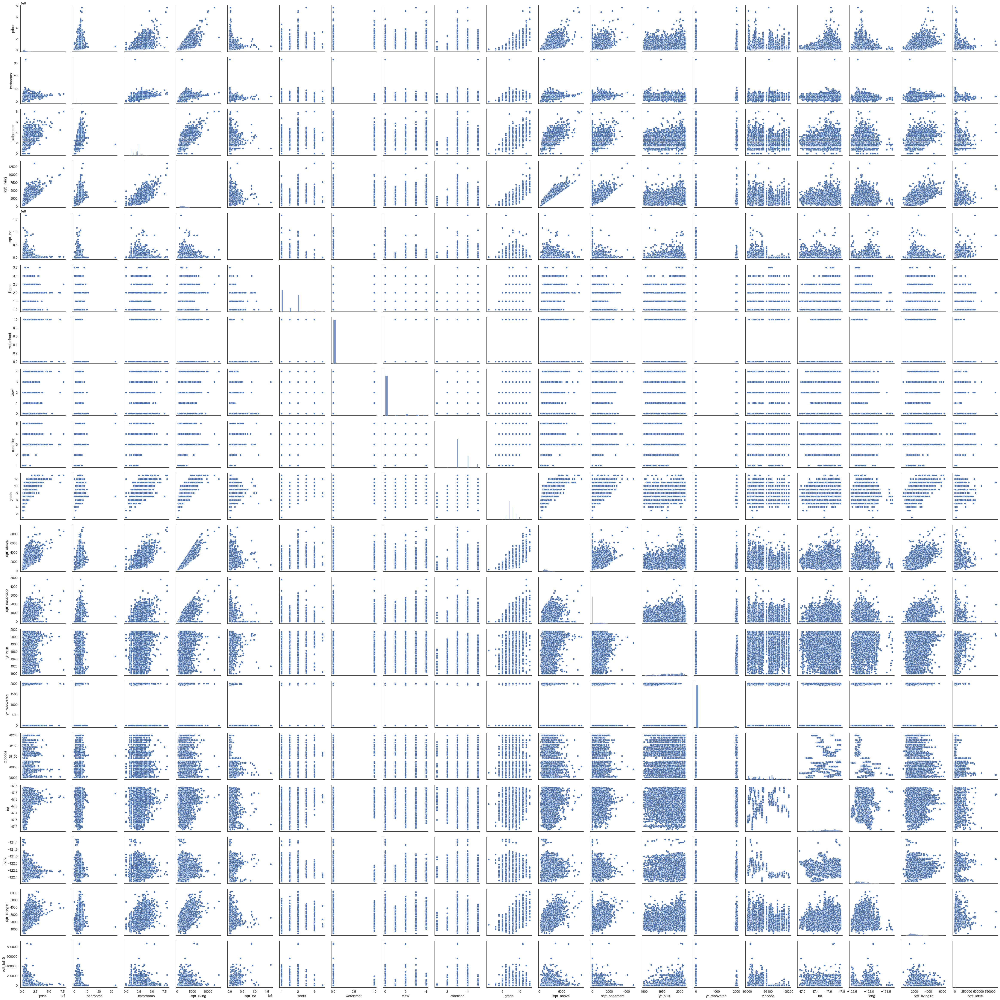

In [8]:
sns.pairplot(data=df_house)

In [9]:
df_house.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [10]:
for el in df_house.columns:
    print(f"{el}: {df_house[el].unique().shape[0]}")

price: 4028
bedrooms: 13
bathrooms: 30
sqft_living: 1038
sqft_lot: 9782
floors: 6
waterfront: 2
view: 5
condition: 5
grade: 12
sqft_above: 946
sqft_basement: 306
yr_built: 116
yr_renovated: 70
zipcode: 70
lat: 5034
long: 752
sqft_living15: 777
sqft_lot15: 8689


In [11]:
cat_col = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade']
non_cat_col = ['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']

In [12]:
col_num = 4
rows_number = int(len(non_cat_col)/col_num)+1

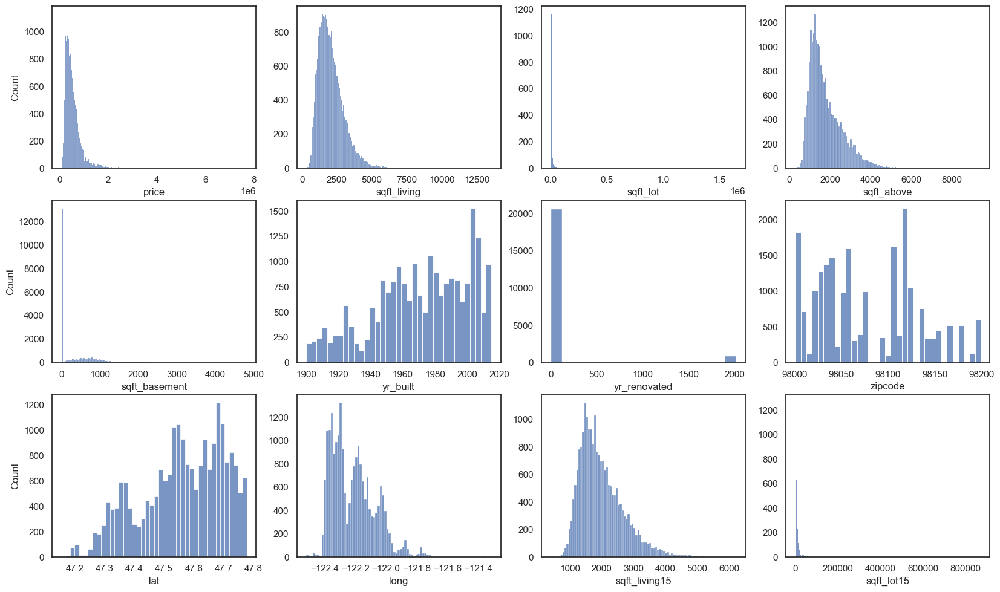

In [13]:
fig, ax = plt.subplots(rows_number, col_num, figsize=(col_num*5, rows_number*4))
for i in range(len(non_cat_col), rows_number*col_num):
    fig.delaxes(ax[rows_number-1, i%col_num])
for i in range(len(non_cat_col)):
    sns.histplot(df_house[non_cat_col[i]], ax=ax[int(i/col_num),i%col_num])
    if i % col_num != 0:  # If not the first column in the row, remove y-axis labels
        ax[int(i/col_num),i%col_num].set_ylabel("")
plt.show()

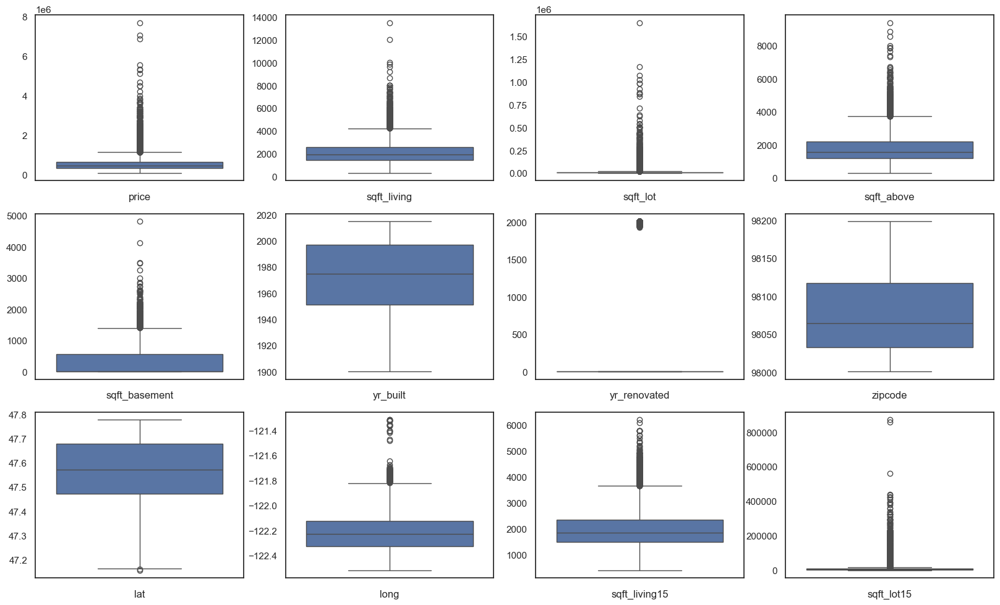

In [14]:
fig, ax = plt.subplots(rows_number, col_num, figsize=(col_num*5, rows_number*4))
for i in range(len(non_cat_col), rows_number*col_num):
    fig.delaxes(ax[rows_number-1, i%col_num])
for i in range(len(non_cat_col)):
    sns.boxplot(df_house[non_cat_col[i]], ax=ax[int(i/col_num),i%col_num])
    ax[int(i/col_num),i%col_num].set_xlabel(non_cat_col[i])
    ax[int(i/col_num),i%col_num].set_ylabel("")
plt.show()

<Axes: xlabel='sqft_lot15', ylabel='Count'>

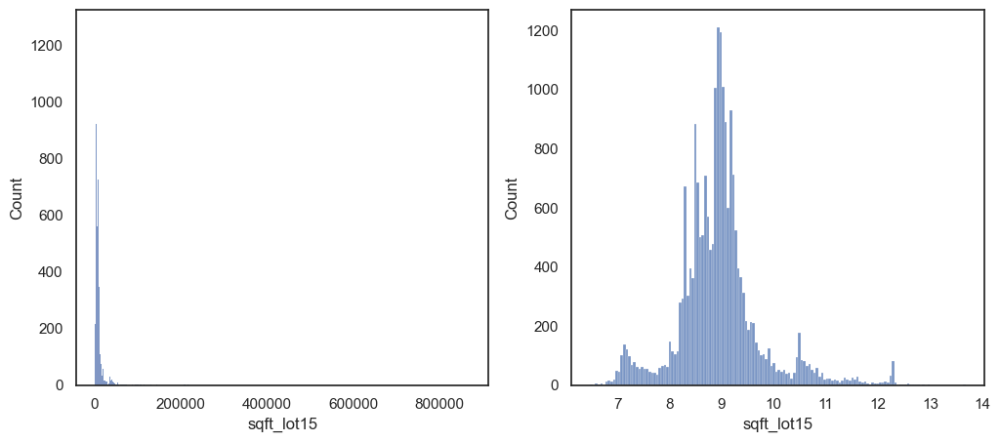

In [15]:
col = "sqft_lot15"
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(df_house[col], ax=ax[0])
sns.histplot(np.log(df_house[col]), ax=ax[1])

In [16]:
mode_value = df_house["yr_renovated"].mode().iloc[0]
mode_value

0

<Axes: xlabel='yr_renovated', ylabel='Count'>

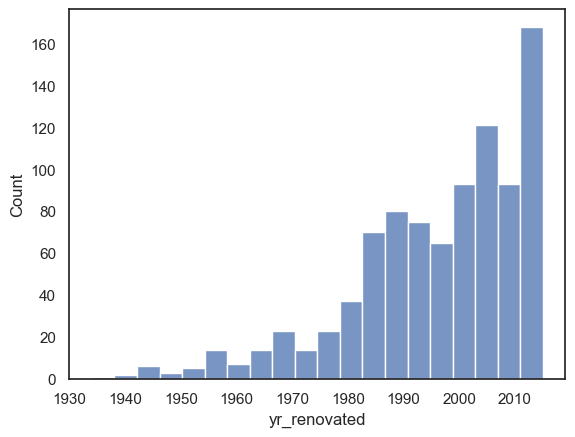

In [17]:
sns.histplot(df_house["yr_renovated"].where(df_house["yr_renovated"]!=mode_value))

<Axes: >

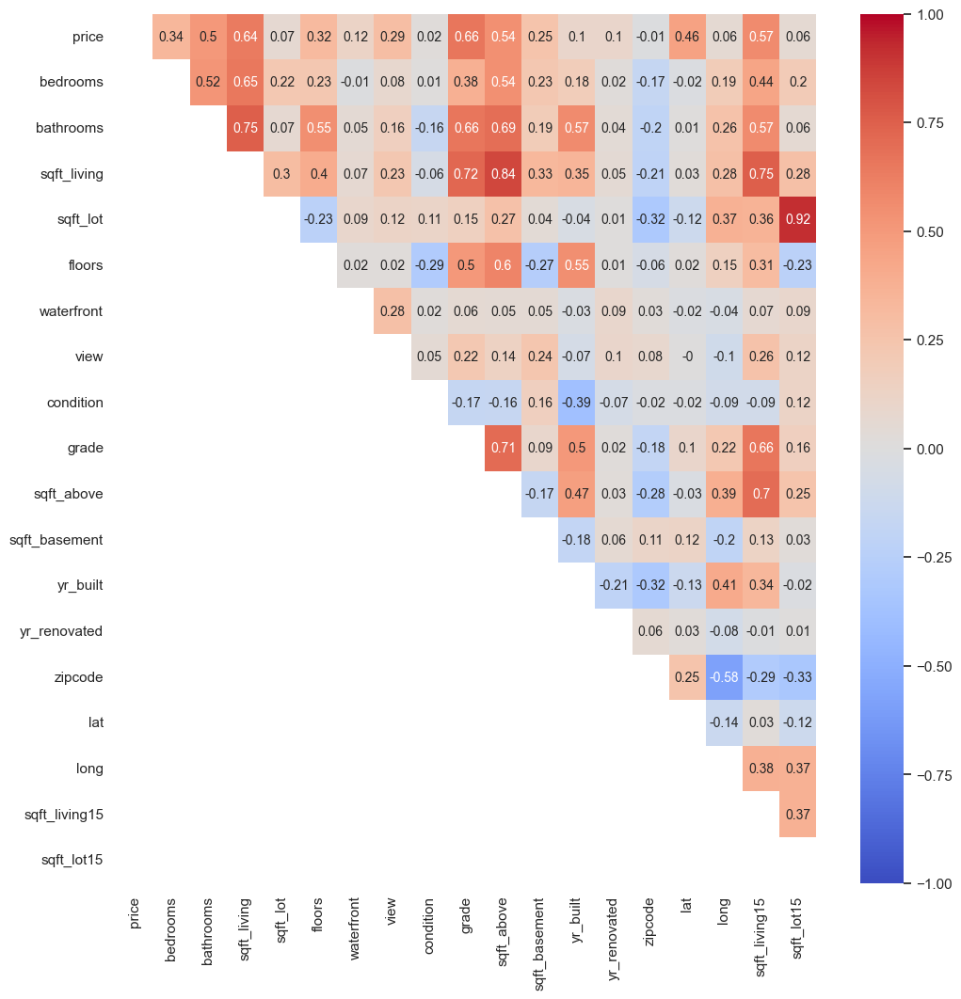

In [18]:
plt.figure(figsize = (12,12))
sns.heatmap(round(df_house.corr(method = 'spearman'),2), mask = np.tril(df_house.corr(method = 'spearman')), vmax=1, vmin=-1, 
            center=0,cmap='coolwarm', annot=True, annot_kws={"size": 10})

<Axes: xlabel='sqft_above', ylabel='Percent'>

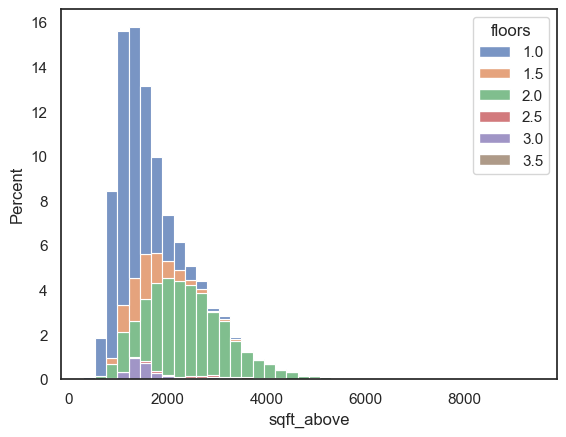

In [19]:
sns.histplot(data=df_house, x="sqft_above", hue="floors", multiple="stack", stat="percent", palette="deep", bins=40)

### DT feature importances

In [20]:
model = tree.DecisionTreeRegressor(random_state=42)
indep_col = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15']
dep_col = 'price'

x_train = df_house.loc[:, indep_col]
y_train = df_house[[dep_col]]
model.fit(x_train, y_train)

DecisionTreeRegressor(random_state=42)

In [21]:
# feature importance
dict(zip(indep_col, model.feature_importances_))

{'bedrooms': 0.0017823038040985539,
 'bathrooms': 0.004379419555454391,
 'sqft_living': 0.2533026296236526,
 'sqft_lot': 0.020618477348029653,
 'floors': 0.0007997087503832555,
 'waterfront': 0.03308769797750941,
 'view': 0.007842041385773829,
 'condition': 0.0025076080679202442,
 'grade': 0.3378472462172152,
 'sqft_above': 0.028327857103437565,
 'sqft_basement': 0.004746964347163007,
 'yr_built': 0.01696942532934737,
 'yr_renovated': 0.002003302321856981,
 'zipcode': 0.012343659352031263,
 'lat': 0.1671300948474158,
 'long': 0.06420184755930275,
 'sqft_living15': 0.026819489248025803,
 'sqft_lot15': 0.015290227161382584}

### Constraints & Conditions

In [22]:
# class balance
for el in cat_col:
    print(df_house[[el]].value_counts()/len(df_house))

bedrooms
3           0.454541
4           0.318419
2           0.127701
5           0.074076
6           0.012585
1           0.009207
7           0.001758
0           0.000601
8           0.000601
9           0.000278
10          0.000139
11          0.000046
33          0.000046
Name: count, dtype: float64
bathrooms
2.50         0.248924
1.00         0.178226
1.75         0.141026
2.25         0.094712
2.00         0.089298
1.50         0.066904
2.75         0.054828
3.00         0.034840
3.50         0.033822
3.25         0.027252
3.75         0.007172
4.00         0.006293
4.50         0.004627
4.25         0.003655
0.75         0.003331
4.75         0.001064
5.00         0.000972
5.25         0.000601
5.50         0.000463
0.00         0.000463
1.25         0.000416
6.00         0.000278
0.50         0.000185
5.75         0.000185
6.25         0.000093
6.50         0.000093
6.75         0.000093
8.00         0.000093
7.50         0.000046
7.75         0.000046
Name: count, dtype: 

<Axes: xlabel='bedrooms', ylabel='count'>

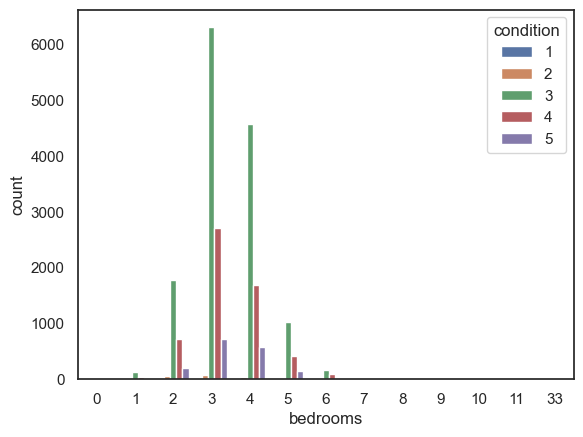

In [23]:
# condition
sns.countplot(data=df_house, x="bedrooms", hue="condition", palette="deep")

In [24]:
indicator = (df_house["bedrooms"] == 3) & (df_house["condition"] == 3)
count = indicator.sum()
count/len(df_house)

0.2918613797251654

### Model parameters

In [25]:
categorical_cols = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade']
general_cols = []
continuous_cols = ['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'yr_built', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'zipcode']
mixed_cols = ['sqft_basement', 'yr_renovated']
components_numbers = {'price': 7, 'sqft_living': 7, 'sqft_lot': 10, 'sqft_above': 7, 'yr_built': 8, 'sqft_basement': 6, 'yr_renovated': 12, 'lat': 8, 'long': 10, 'sqft_living15': 5, 'sqft_lot15': 10, 'zipcode': 8}
mixed_modes = {"sqft_basement": [0], 'yr_renovated': [0]}
log_transf = ['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_living15', 'sqft_lot15']

class_balance = {"view": [0.5, 0.1, 0.1, 0.1, 0.2]} # constraint
condition_list = [{"col1":"bedrooms", "cat1": 3, "col2": "condition", "cat2":3}]
cond_ratio = 0.1

target_col = "price"
data_name = "house"
task = "regr"

## Generated data

### EDA

In [26]:
df_house_fake = pd.read_csv("..\\..\\results\\house\\synth_data\\constr_loss.csv",sep=',')
df_house_fake.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,347232.1,2,1.00,2876,17426,1.0,0,0,5,6,1209,962,1954,0,98123,47.5678,-122.293,1970,6235
1,1991837.5,3,3.25,4743,8975,2.0,0,0,3,8,3404,0,2008,0,98047,47.6133,-122.081,3811,10624
2,518891.0,3,1.75,1911,9176,1.5,0,2,4,7,1297,1143,1908,0,98120,47.5844,-122.335,2055,5509
3,295414.9,3,2.25,2159,9693,1.0,0,0,3,7,1592,0,1960,0,98075,47.5368,-122.165,2993,10569
4,512760.8,3,1.50,997,4158,2.0,0,0,3,7,1206,0,2006,0,98053,47.6842,-122.119,1705,5796


In [27]:
df_house_fake.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          2000 non-null   float64
 1   bedrooms       2000 non-null   int64  
 2   bathrooms      2000 non-null   float64
 3   sqft_living    2000 non-null   int64  
 4   sqft_lot       2000 non-null   int64  
 5   floors         2000 non-null   float64
 6   waterfront     2000 non-null   int64  
 7   view           2000 non-null   int64  
 8   condition      2000 non-null   int64  
 9   grade          2000 non-null   int64  
 10  sqft_above     2000 non-null   int64  
 11  sqft_basement  2000 non-null   int64  
 12  yr_built       2000 non-null   int64  
 13  yr_renovated   2000 non-null   int64  
 14  zipcode        2000 non-null   int64  
 15  lat            2000 non-null   float64
 16  long           2000 non-null   float64
 17  sqft_living15  2000 non-null   int64  
 18  sqft_lot

In [28]:
df_house_fake.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,6.824824e+05,3.382000,2.167750,2543.712000,21819.490000,1.49125,0.007000,0.266500,3.40600,7.696500,2233.831000,349.111500,1974.490000,1.119000,98082.576000,47.588579,-122.185282,2463.393000,14754.322500
std,4.712548e+05,0.884006,0.751635,983.137985,55498.328071,0.54401,0.083394,0.823296,0.65527,1.153713,966.055018,489.167218,28.225578,9.432249,50.117333,0.124286,0.146046,737.708204,29411.256571
min,2.086480e+05,1.000000,0.750000,820.000000,1065.000000,1.00000,0.000000,0.000000,1.00000,4.000000,831.000000,0.000000,1905.000000,0.000000,98001.000000,47.293200,-122.423000,1064.000000,1346.000000
25%,3.834463e+05,3.000000,1.750000,1793.000000,5960.000000,1.00000,0.000000,0.000000,3.00000,7.000000,1465.750000,0.000000,1957.000000,0.000000,98040.000000,47.514975,-122.295250,1910.000000,6358.250000
50%,5.298124e+05,3.000000,2.250000,2419.500000,9200.000000,1.50000,0.000000,0.000000,3.00000,7.000000,1838.500000,0.000000,1976.000000,0.000000,98073.000000,47.597050,-122.177500,2240.500000,8359.000000
75%,7.984632e+05,4.000000,2.500000,3069.000000,13872.750000,2.00000,0.000000,0.000000,4.00000,8.000000,2975.500000,797.500000,1997.000000,0.000000,98123.000000,47.696300,-122.101000,2965.750000,11417.250000
max,3.971356e+06,8.000000,6.500000,9191.000000,559624.000000,3.00000,1.000000,4.000000,5.00000,12.000000,9169.000000,1913.000000,2015.000000,171.000000,98199.000000,47.777600,-121.695000,5119.000000,360969.000000


In [29]:
df_house_fake.duplicated().sum()

0

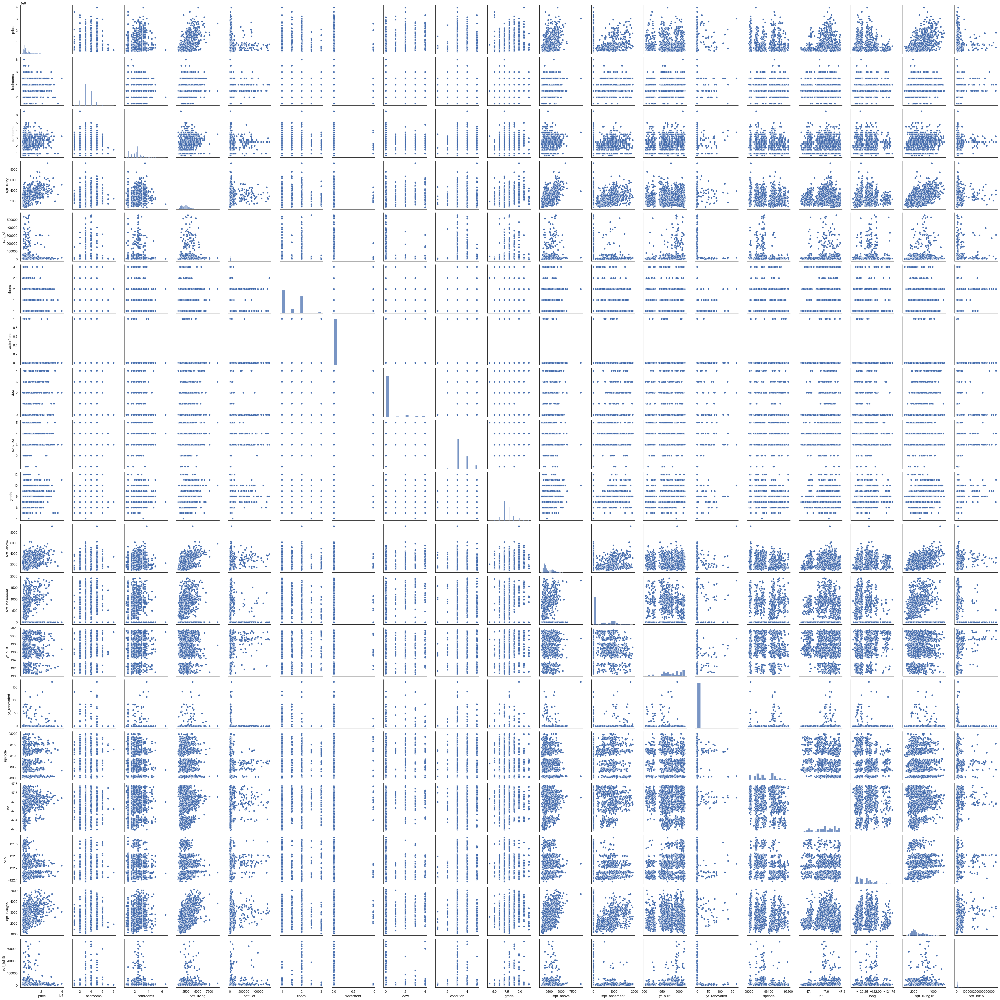

In [30]:
sns.pairplot(data=df_house_fake)

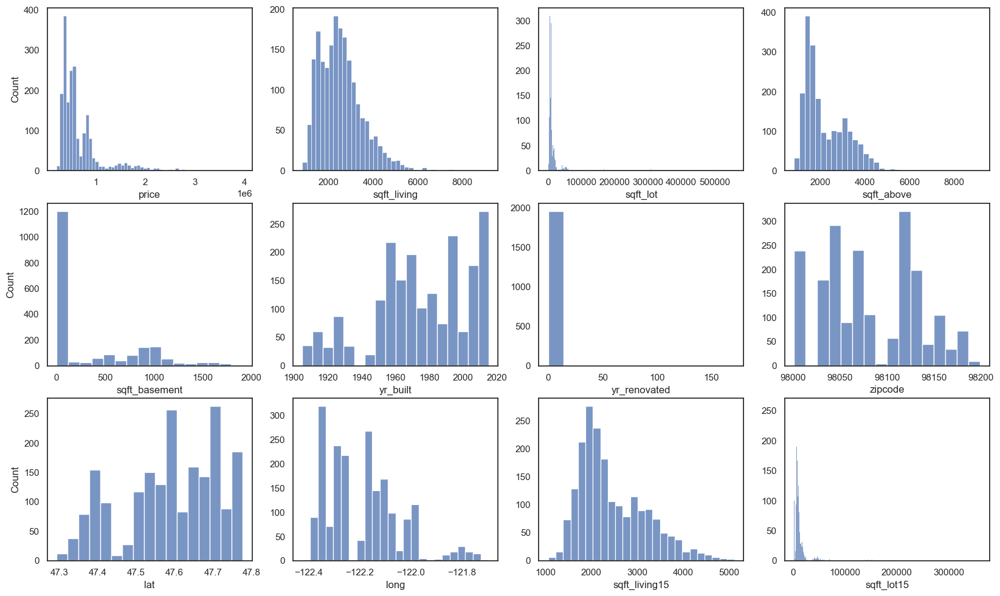

In [31]:
fig, ax = plt.subplots(rows_number, col_num, figsize=(col_num*5, rows_number*4))
for i in range(len(non_cat_col), rows_number*col_num):
    fig.delaxes(ax[rows_number-1, i%col_num])
for i in range(len(non_cat_col)):
    sns.histplot(df_house_fake[non_cat_col[i]], ax=ax[int(i/col_num),i%col_num])
    if i % col_num != 0:  # If not the first column in the row, remove y-axis labels
        ax[int(i/col_num),i%col_num].set_ylabel("")
plt.show()

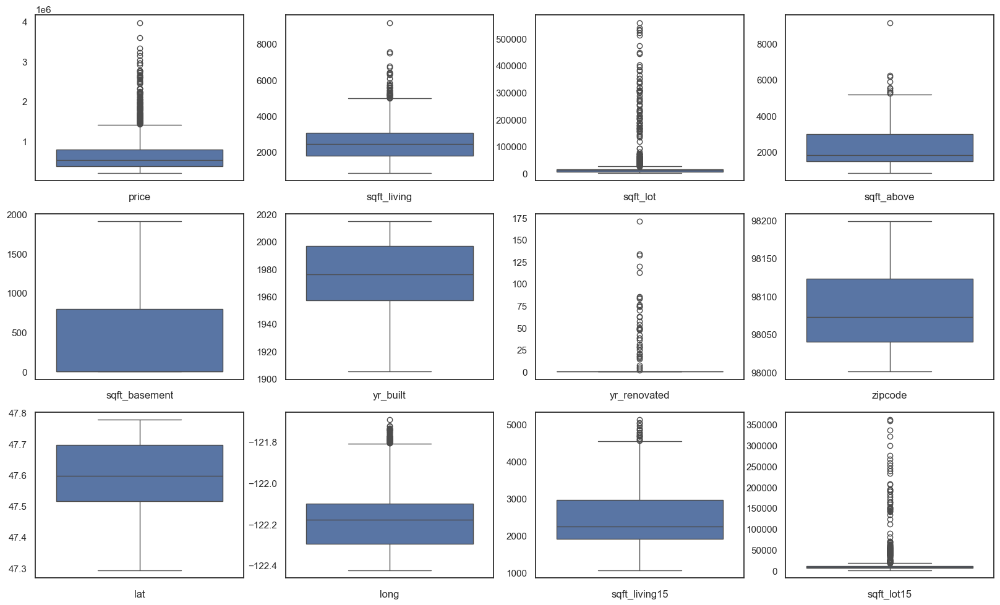

In [32]:
fig, ax = plt.subplots(rows_number, col_num, figsize=(col_num*5, rows_number*4))
for i in range(len(non_cat_col), rows_number*col_num):
    fig.delaxes(ax[rows_number-1, i%col_num])
for i in range(len(non_cat_col)):
    sns.boxplot(df_house_fake[non_cat_col[i]], ax=ax[int(i/col_num),i%col_num])
    ax[int(i/col_num),i%col_num].set_xlabel(non_cat_col[i])
    ax[int(i/col_num),i%col_num].set_ylabel("")
plt.show()

<Axes: xlabel='sqft_lot15', ylabel='Count'>

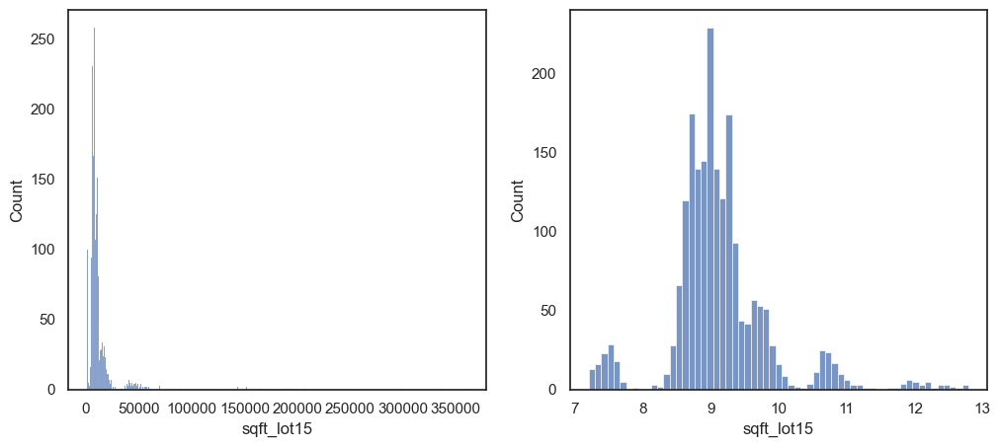

In [33]:
col = "sqft_lot15"
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(df_house_fake[col], ax=ax[0])
sns.histplot(np.log(df_house_fake[col]), ax=ax[1])

In [34]:
mode_value = df_house_fake["yr_renovated"].mode().iloc[0]
mode_value

0

<Axes: xlabel='yr_renovated', ylabel='Count'>

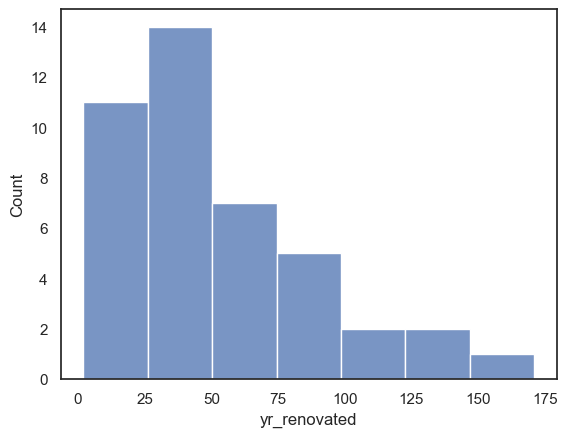

In [35]:
sns.histplot(df_house_fake["yr_renovated"].where(df_house_fake["yr_renovated"]!=mode_value))

<Axes: >

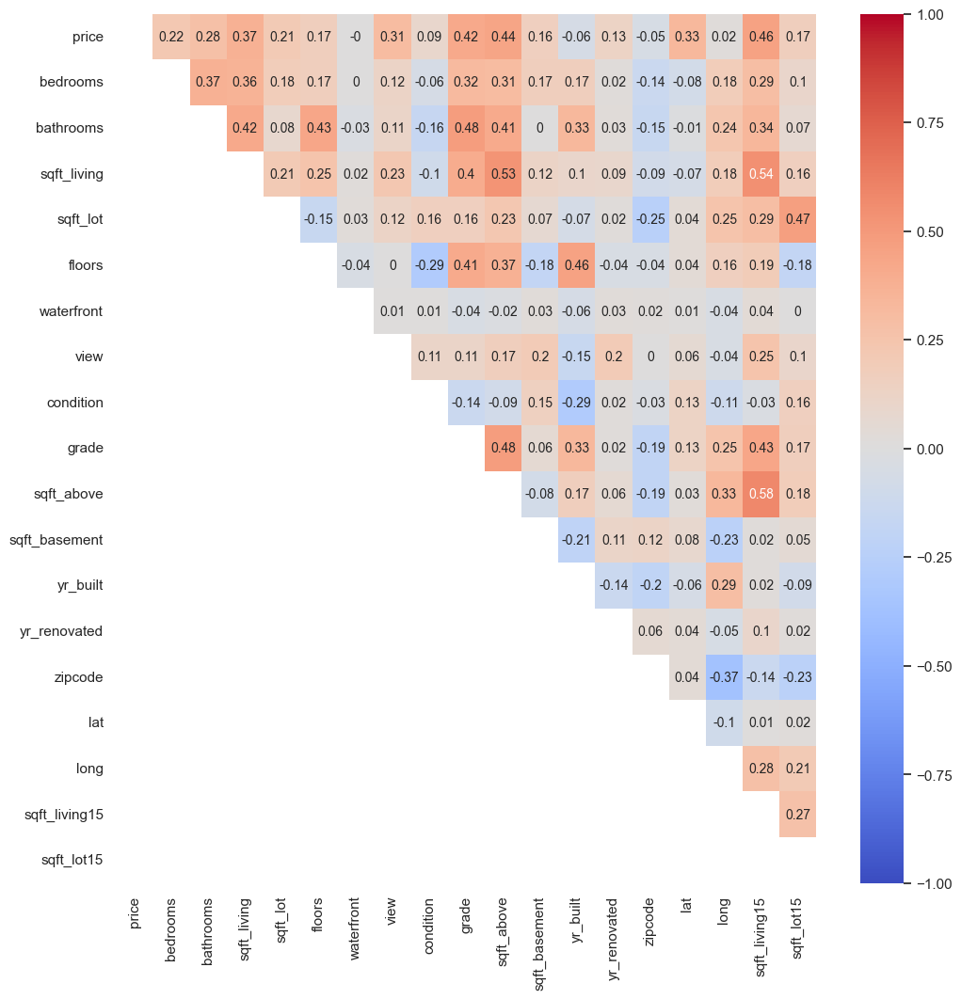

In [36]:
plt.figure(figsize = (12,12))
sns.heatmap(round(df_house_fake.corr(method = 'spearman'),2), mask = np.tril(df_house_fake.corr(method = 'spearman')), vmax=1, vmin=-1, 
            center=0,cmap='coolwarm', annot=True, annot_kws={"size": 10})

<Axes: xlabel='sqft_above', ylabel='Percent'>

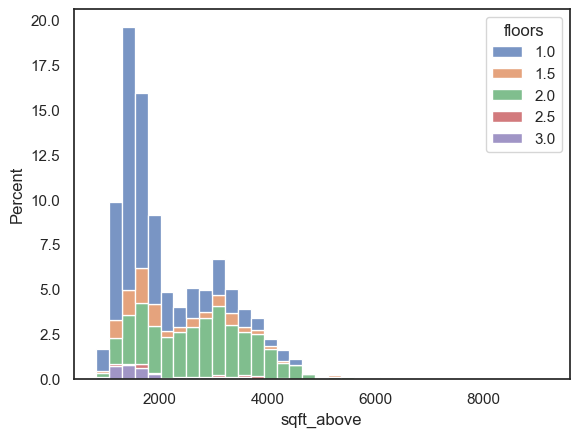

In [37]:
sns.histplot(data=df_house_fake, x="sqft_above", hue="floors", multiple="stack", stat="percent", palette="deep")

### Constraints & Conditions

In [38]:
# class balance
for el in cat_col:
    print(df_house_fake[[el]].value_counts()/len(df_house_fake))

bedrooms
3           0.4735
4           0.3130
2           0.1120
5           0.0760
6           0.0135
1           0.0100
7           0.0015
8           0.0005
Name: count, dtype: float64
bathrooms
2.50         0.2380
1.00         0.1485
1.75         0.1420
2.25         0.1155
2.00         0.0860
1.50         0.0670
2.75         0.0635
3.50         0.0415
3.00         0.0365
3.25         0.0320
3.75         0.0105
4.50         0.0055
0.75         0.0040
4.00         0.0035
4.25         0.0020
5.00         0.0020
4.75         0.0015
6.50         0.0005
Name: count, dtype: float64
floors
1.0       0.4975
2.0       0.3670
1.5       0.0945
3.0       0.0310
2.5       0.0100
Name: count, dtype: float64
waterfront
0             0.993
1             0.007
Name: count, dtype: float64
view
0       0.8920
2       0.0505
3       0.0255
4       0.0190
1       0.0130
Name: count, dtype: float64
condition
3            0.6415
4            0.2695
5            0.0760
2            0.0105
1            0.0

<Axes: xlabel='bedrooms', ylabel='count'>

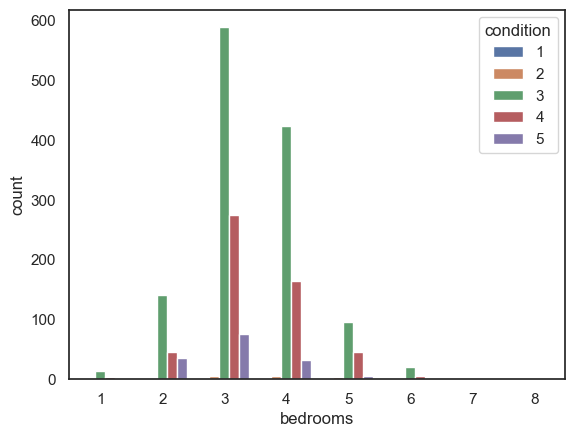

In [39]:
# condition
sns.countplot(data=df_house_fake, x="bedrooms", hue="condition", palette="deep")

In [40]:
indicator = (df_house_fake["bedrooms"] == 3) & (df_house_fake["condition"] == 3)
count = indicator.sum()
count/len(df_house_fake)

0.294

## Merged

In [41]:
df_house_m = df_house.copy()
df_house_fake_m = df_house_fake.copy()

In [42]:
df_house_m = df_house_m.sample(len(df_house_fake_m))

In [43]:
df_house_m["data"] = "real"
df_house_fake_m["data"] = "fake"

In [44]:
df_merged = pd.concat([df_house_m,  df_house_fake_m],ignore_index=True)

In [45]:
df_merged.duplicated().sum()

0

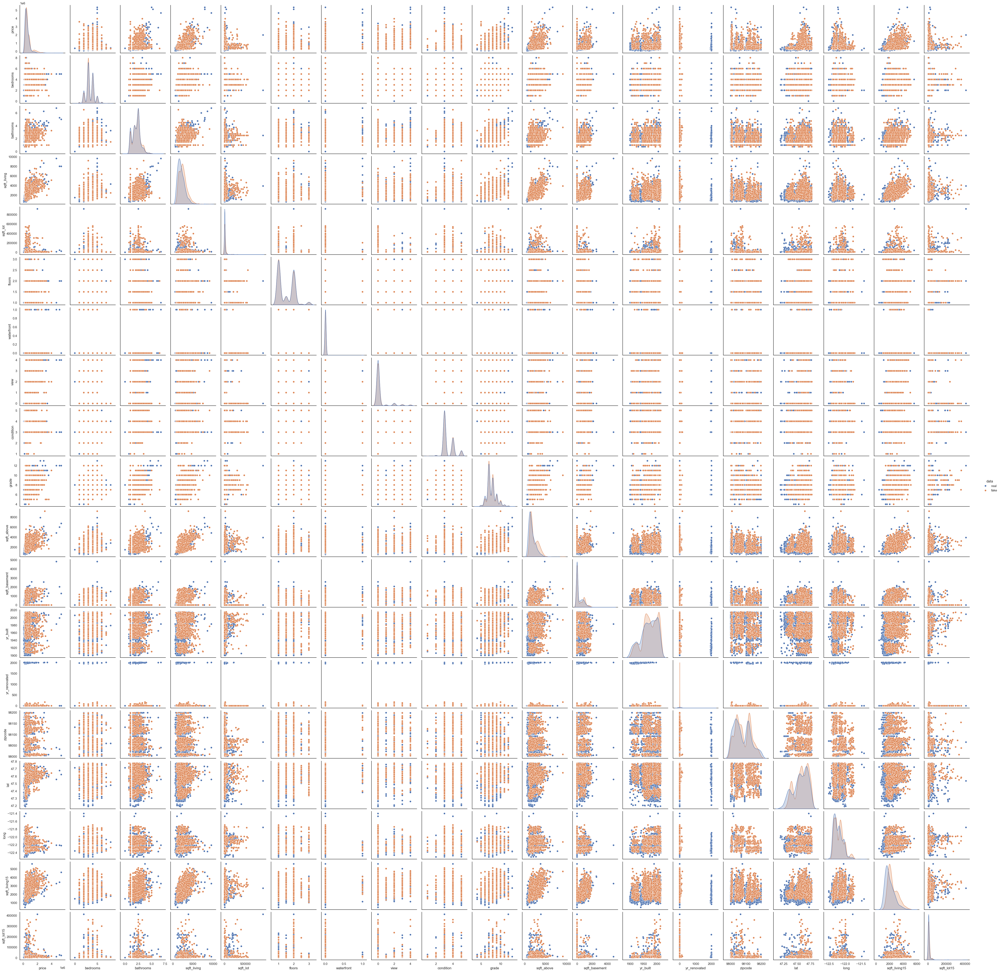

In [46]:
sns.pairplot(df_merged, hue="data")

In [47]:
!jupyter nbconvert --to html --no-input house.ipynb

[NbConvertApp] Converting notebook house.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 17 image(s).
[NbConvertApp] Writing 21699477 bytes to house.html
